#**Food Security**

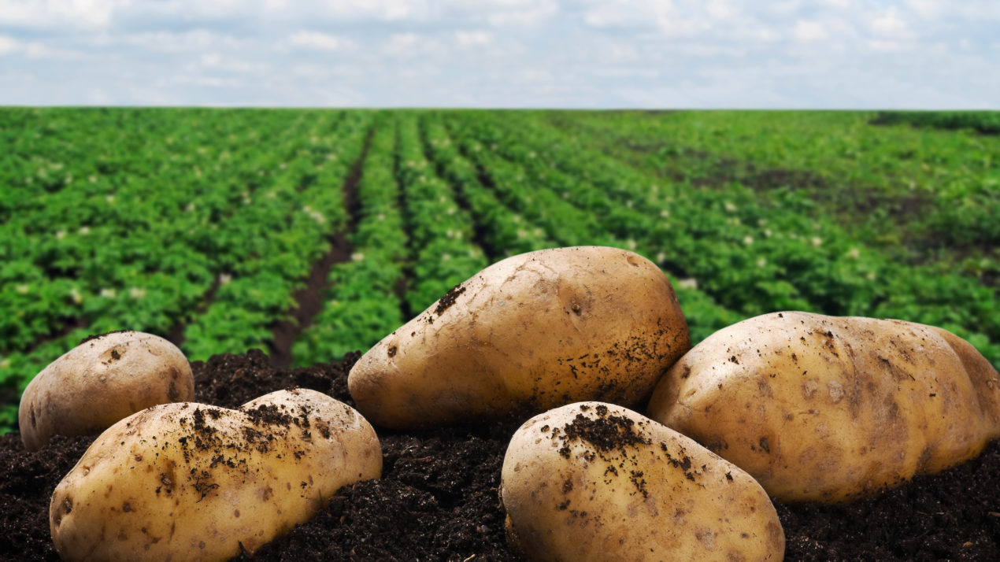


**Steps Performed**

Business Understanding

Data Understanding

Data Collection 

Data Integration

Data Selection

Data Preprocessing

Data Cleaning

Data Imputation

Feature Engineering

Correlation Matrix

Scaling and Normalization

Model

EDA

Trend Analysis

Statistical analysis of yield

Conclusion - Results and Findings

# 🧳 Business Understanding

The goal is to understand the impact of climate change on the production of potatoes in India and replicate across other supplying countries for the PotatoCo.

# Area_harvested -> Production -> Yield

Import statements

In [ ]:
!pip install featurewiz --ignore-installed --no-deps
!pip install --upgrade category_encoders
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached featurewiz-0.2.3-py3-none-any.whl (111 kB)


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     | 22.0 MB 171 kB/s
     |████████████████████████████████| 102 kB 31.9 MB/s 
     |████████████████████████████████| 696 kB 71.0 MB/s 
     |████████████████████████████████| 62 kB 1.7 MB/s 
     |████████████████████████████████| 9.9 MB 60.1 MB/s 
     |████████████████████████████████| 4.7 MB 58.5 MB/s 
     |████████████████████████████████| 296 kB 78.1 MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-dev-py2.py3-none-any.whl size=324949 sha256=a8be9f440ffe1b0735a245358619b371897abf3337bb1a78ddc627e8714be63d
  Stored in directory: /tmp/pip-ephem-wheel-cache-lbr7tpac/wheels/64/b6/85/dfc808b23666a5910371784e349d28818006ff63ed9cfeca59
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=a080e6ab68e4ea254127a73baa030c0c12beb959cf331

**Data Preparation**

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np 
import plotly.express as px
%matplotlib inline
from featurewiz import featurewiz
from pandas_profiling import ProfileReport

In [ ]:
file_area = 'https://raw.githubusercontent.com/Dhanasree-Rajamani/256-Hackathon-/main/256%20Hackathon/FAOSTAT_data_en_12-3-2022.csv' 
df_area = pd.read_csv(file_area)

In [ ]:
df_area.head()

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Year Code,Year,Unit,Value,Flag,Flag Description
0,QCL,Crops and livestock products,356,India,5312,Area harvested,1510,Potatoes,1961,1961,ha,375000,A,Official figure
1,QCL,Crops and livestock products,356,India,5312,Area harvested,1510,Potatoes,1962,1962,ha,365000,A,Official figure
2,QCL,Crops and livestock products,356,India,5312,Area harvested,1510,Potatoes,1963,1963,ha,413000,A,Official figure
3,QCL,Crops and livestock products,356,India,5312,Area harvested,1510,Potatoes,1964,1964,ha,415000,A,Official figure
4,QCL,Crops and livestock products,356,India,5312,Area harvested,1510,Potatoes,1965,1965,ha,429000,A,Official figure


Pivot to get the area, production and yield by year

In [ ]:
area_summary = df_area.pivot_table('Value', ['Year'], 'Element')

In [ ]:
final_area_summary = area_summary.reset_index()

In [ ]:
final_area_summary.head()

Element,Year,Area harvested,Production,Yield
0,1961,375000,2719000,72507
1,1962,365000,2447000,67041
2,1963,413000,3365000,81477
3,1964,415000,2593000,62482
4,1965,429000,3605000,84033


Checking if the dataset has production values of potatoes only

In [ ]:
df_area['Item Code (CPC)'].unique()

array([1510])

Data for years 1961 - 2020 is available

In [ ]:
df_area['Year'].unique()

array([1961, 1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970, 1971,
       1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982,
       1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993,
       1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004,
       2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015,
       2016, 2017, 2018, 2019, 2020])

# Fertilizers

In [ ]:
file_fertilizers = 'https://raw.githubusercontent.com/Dhanasree-Rajamani/256-Hackathon-/main/256%20Hackathon/Fertilizers_FAOSTAT_data_en_12-3-2022.csv' 
df_fertilizers = pd.read_csv(file_fertilizers)

In [ ]:
df_fertilizers.head()

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code,Item,Year Code,Year,Unit,Value,Flag,Flag Description
0,EF,Fertilizers indicators,356,India,5159,Use per area of cropland,3102,Nutrient nitrogen N (total),1961,1961,kg/ha,1.55,E,Estimated value
1,EF,Fertilizers indicators,356,India,5159,Use per area of cropland,3102,Nutrient nitrogen N (total),1962,1962,kg/ha,2.05,E,Estimated value
2,EF,Fertilizers indicators,356,India,5159,Use per area of cropland,3102,Nutrient nitrogen N (total),1963,1963,kg/ha,2.33,E,Estimated value
3,EF,Fertilizers indicators,356,India,5159,Use per area of cropland,3102,Nutrient nitrogen N (total),1964,1964,kg/ha,3.42,E,Estimated value
4,EF,Fertilizers indicators,356,India,5159,Use per area of cropland,3102,Nutrient nitrogen N (total),1965,1965,kg/ha,3.54,E,Estimated value


In [ ]:
fertilizer_summary = df_fertilizers.pivot_table('Value', ['Year'], 'Item')

In [ ]:
final_fertilizer_summary = fertilizer_summary.reset_index()

In [ ]:
final_fertilizer_summary.head()

Item,Year,Nutrient nitrogen N (total),Nutrient phosphate P2O5 (total),Nutrient potash K2O (total)
0,1961,1.55,0.38,0.17
1,1962,2.05,0.51,0.22
2,1963,2.33,0.72,0.31
3,1964,3.42,0.92,0.43
4,1965,3.54,0.82,0.48


In [ ]:
fertilizer_summary.columns

Index(['Nutrient nitrogen N (total)', 'Nutrient phosphate P2O5 (total)',
       'Nutrient potash K2O (total)'],
      dtype='object', name='Item')

Getting the different fertilizers used on the potato crops

In [ ]:
df_fertilizers['Item'].unique()

array(['Nutrient nitrogen N (total)', 'Nutrient phosphate P2O5 (total)',
       'Nutrient potash K2O (total)'], dtype=object)

#Emissions(CO2)

In [ ]:
file_emission = 'https://raw.githubusercontent.com/Dhanasree-Rajamani/256-Hackathon-/main/256%20Hackathon/Emissions_FAOSTAT_data_en_12-3-2022.csv' 
df_emission = pd.read_csv(file_emission)

In [ ]:
df_emission['Value'].isnull().values.any()

False

In [ ]:
df_emission.loc[(df_emission['Element'] == 'Emissions (CO2)') & (df_emission['Year'] == 1991)].head()

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code,Item,Year Code,Year,Source Code,Source,Unit,Value,Flag,Flag Description,Note
2193,GT,Emissions Totals,356,India,7273,Emissions (CO2),67292,Drained organic soils (CO2),1991,1991,3050,FAO TIER 1,kilotonnes,6768.3617,E,Estimated value,NaN
2354,GT,Emissions Totals,356,India,7273,Emissions (CO2),6994,On-farm energy use,1991,1991,3050,FAO TIER 1,kilotonnes,36767.1039,E,Estimated value,NaN
2534,GT,Emissions Totals,356,India,7273,Emissions (CO2),6751,Forestland,1991,1991,3050,FAO TIER 1,kilotonnes,-227396.9133,E,Estimated value,NaN
2596,GT,Emissions Totals,356,India,7273,Emissions (CO2),6750,Net Forest conversion,1991,1991,3050,FAO TIER 1,kilotonnes,0.0000,E,Estimated value,NaN
2816,GT,Emissions Totals,356,India,7273,Emissions (CO2),6993,Fires in organic soils,1991,1991,3050,FAO TIER 1,kilotonnes,0.0000,E,Estimated value,NaN


In [ ]:
emission_summary = df_emission.loc[df_emission['Element'] == 'Emissions (CO2)'].pivot_table('Value', ['Year'], 'Element')

In [ ]:
emission_summary.head()

Element,Emissions (CO2)
Year,
1990,35026.938825
1991,38515.459344
1992,41636.038525
1993,43984.183713
1994,47458.533563


In [ ]:
final_emission_summary = emission_summary.reset_index()

In [ ]:
final_emission_summary.head()

Element,Year,Emissions (CO2)
0,1990,35026.938825
1,1991,38515.459344
2,1992,41636.038525
3,1993,43984.183713
4,1994,47458.533563


In [ ]:
df_emission['Element Code'].unique()

array([  7234,   7236,   7230, 724313, 723113,   7225, 724413,   7273,
       717815])

Looking at the different kind of emissions

We are focusing primarily on CO2 emissions

In [ ]:
df_emission['Element'].unique()

array(['Direct emissions (N2O)', 'Indirect emissions (N2O)',
       'Emissions (N2O)', 'Emissions (CO2eq) from N2O (AR5)',
       'Emissions (CO2eq) (AR5)', 'Emissions (CH4)',
       'Emissions (CO2eq) from CH4 (AR5)', 'Emissions (CO2)',
       'Emissions (CO2eq) from F-gases (AR5)'], dtype=object)

In [ ]:
result = pd.merge(final_area_summary, final_fertilizer_summary, how = 'left', on='Year')

In [ ]:
result = pd.merge(result, final_emission_summary, how = 'left', on='Year')

In [ ]:
result.rename(columns={'Year': 'year', 'Area harvested': 'area_harvested', 'Production': 'production', 'Yield': 'yield' ,'Nutrient nitrogen N (total)': 'nitrogen_unit_val', 'Nutrient phosphate P2O5 (total)': 'phosphate_unit_val', 'Nutrient potash K2O (total)': 'potash_unit_val', 'Emissions (CO2)': 'co2_emissions' }
          , inplace=True)

In [ ]:
result['total_nitrogen'] = result['area_harvested'] * result['nitrogen_unit_val']
result['total_phosphate'] = result['area_harvested'] * result['phosphate_unit_val']
result['total_potash'] = result['area_harvested'] * result['potash_unit_val']

In [ ]:
#temp_cols=result.columns.tolist()
#index=result.columns.get_loc("yield")
#new_cols=temp_cols[0:index]  + temp_cols[index+1:] + temp_cols[index:index+1]
#result=result[new_cols]

In [ ]:
result.head()

,year,area_harvested,production,yield,nitrogen_unit_val,phosphate_unit_val,potash_unit_val,co2_emissions,total_nitrogen,total_phosphate,total_potash
0,1961,375000,2719000,72507,1.55,0.38,0.17,NaN,581250.0,142500.0,63750.0
1,1962,365000,2447000,67041,2.05,0.51,0.22,NaN,748250.0,186150.0,80300.0
2,1963,413000,3365000,81477,2.33,0.72,0.31,NaN,962290.0,297360.0,128030.0
3,1964,415000,2593000,62482,3.42,0.92,0.43,NaN,1419300.0,381800.0,178450.0
4,1965,429000,3605000,84033,3.54,0.82,0.48,NaN,1518660.0,351780.0,205920.0


#Climate change
* Precepitation
* Mean_temp
* Max_temp
* Min_temp

In [ ]:
mean_temp = pd.read_csv("https://raw.githubusercontent.com/SravaniThota96/FA22-256-Advanced-Data-Mining/Assignment-1/Hackathon/TimeSeries/tas_timeseries_annual_cru_1901-2021_IND.csv", header = 1)

In [ ]:
mean_temp = mean_temp.rename(columns={'Unnamed: 0': 'year', 'Uttar Pradesh': 'mean_temperature'})
df_mean_temp = mean_temp[['year', 'mean_temperature']]
df_mean_temp = df_mean_temp[(df_mean_temp['year'] > 1960) & (df_mean_temp['year'] < 2021)]

In [ ]:
df_mean_temp.head()

,year,mean_temperature
60,1961,25.02
61,1962,25.25
62,1963,25.24
63,1964,25.37
64,1965,25.40


In [ ]:
max_temp = pd.read_csv("https://raw.githubusercontent.com/SravaniThota96/FA22-256-Advanced-Data-Mining/Assignment-1/Hackathon/TimeSeries/tasmax_timeseries_annual_cru_1901-2021_IND.csv",  header = 1)

In [ ]:
max_temp = max_temp.rename(columns={'Unnamed: 0': 'year', 'Uttar Pradesh': 'max_temperature'})
df_max_temp = max_temp[['year', 'max_temperature']]
df_max_temp = df_max_temp[(df_max_temp['year'] > 1960) & (df_max_temp['year'] < 2021)]

In [ ]:
df_max_temp.head()

,year,max_temperature
60,1961,31.47
61,1962,31.88
62,1963,31.91
63,1964,32.07
64,1965,32.12


In [ ]:
min_temp = pd.read_csv("https://raw.githubusercontent.com/SravaniThota96/FA22-256-Advanced-Data-Mining/Assignment-1/Hackathon/TimeSeries/tasmin_timeseries_annual_cru_1901-2021_IND.csv",  header = 1)

In [ ]:
min_temp = min_temp.rename(columns={'Unnamed: 0': 'year', 'Uttar Pradesh': 'min_temperature'})
df_min_temp = min_temp[['year', 'min_temperature']]
df_min_temp = df_min_temp[(df_min_temp['year'] > 1960) & (df_min_temp['year'] < 2021)]

In [ ]:
df_min_temp.head()

,year,min_temperature
60,1961,18.62
61,1962,18.66
62,1963,18.62
63,1964,18.71
64,1965,18.72


In [ ]:
prec = pd.read_csv("https://raw.githubusercontent.com/SravaniThota96/FA22-256-Advanced-Data-Mining/Assignment-1/Hackathon/TimeSeries/pr_timeseries_annual_cru_1901-2021_IND.csv",  header = 1)

In [ ]:
precip = prec.rename(columns={'Unnamed: 0': 'year', 'Uttar Pradesh': 'precipitation'})
df_precip = precip[['year', 'precipitation']]
df_precip = df_precip[(df_precip['year'] > 1960) & (df_precip['year'] < 2021)]

In [ ]:
df_precip.head()

,year,precipitation
60,1961,1198.89
61,1962,1150.14
62,1963,1155.26
63,1964,1093.66
64,1965,833.79


In [ ]:
result = pd.merge(result, df_mean_temp, how = 'left', on='year')
result = pd.merge(result, df_max_temp, how = 'left', on='year')
result = pd.merge(result, df_min_temp, how = 'left', on='year')
result = pd.merge(result, df_precip, how = 'left', on='year')

# Final Dataset

In [ ]:
column = result.pop('yield')
result.insert(result.shape[1], 'yield', column)

In [ ]:
result.head()

,year,area_harvested,production,nitrogen_unit_val,phosphate_unit_val,potash_unit_val,co2_emissions,total_nitrogen,total_phosphate,total_potash,mean_temperature,max_temperature,min_temperature,precipitation,yield
0,1961,375000,2719000,1.55,0.38,0.17,NaN,581250.0,142500.0,63750.0,25.02,31.47,18.62,1198.89,72507
1,1962,365000,2447000,2.05,0.51,0.22,NaN,748250.0,186150.0,80300.0,25.25,31.88,18.66,1150.14,67041
2,1963,413000,3365000,2.33,0.72,0.31,NaN,962290.0,297360.0,128030.0,25.24,31.91,18.62,1155.26,81477
3,1964,415000,2593000,3.42,0.92,0.43,NaN,1419300.0,381800.0,178450.0,25.37,32.07,18.71,1093.66,62482
4,1965,429000,3605000,3.54,0.82,0.48,NaN,1518660.0,351780.0,205920.0,25.40,32.12,18.72,833.79,84033


In [ ]:
df = result.copy()

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np 
import plotly.express as px
%matplotlib inline

#Data Processing

Text(0, 0.5, 'Frequency')

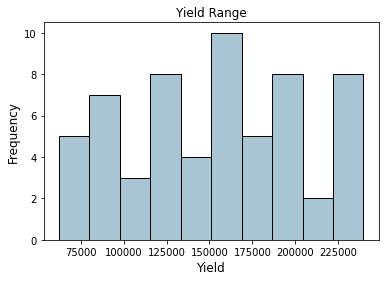

In [ ]:
fig, ax = plt.subplots()
df['yield'].hist(color='#A9C5D3', edgecolor='black',  
                          grid=False)
ax.set_title('Yield Range', fontsize=12)
ax.set_xlabel('Yield', fontsize=12)
ax.set_ylabel('Frequency', fontsize=12)

In [ ]:
df['yield'].max()

239542

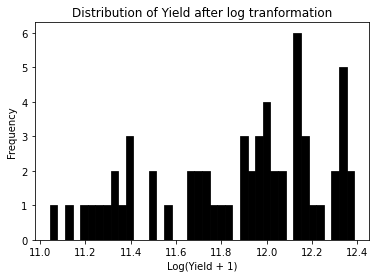

In [ ]:
log_price = np.log1p(df['yield'])

plt.figure(figsize=(6, 4))

sns.histplot(log_price, bins=40, color='black', alpha=1)
plt.ylabel('Frequency')
plt.xlabel('Log(Yield + 1)')
plt.title('Distribution of Yield after log tranformation')

plt.show()

#Feature Engineering

Performing feature engineering using FeatureWiz to understand the importance of various features in determing the target(yield) and the correlation between various features

############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Correlation Limit = 0.7
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
#### Single_Label Regression problem ####
    Loaded train data. Shape = (60, 15)
#### Single_Label Regression problem ####
No test data filename given...
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
        2 variable(s) to be removed since ID or l

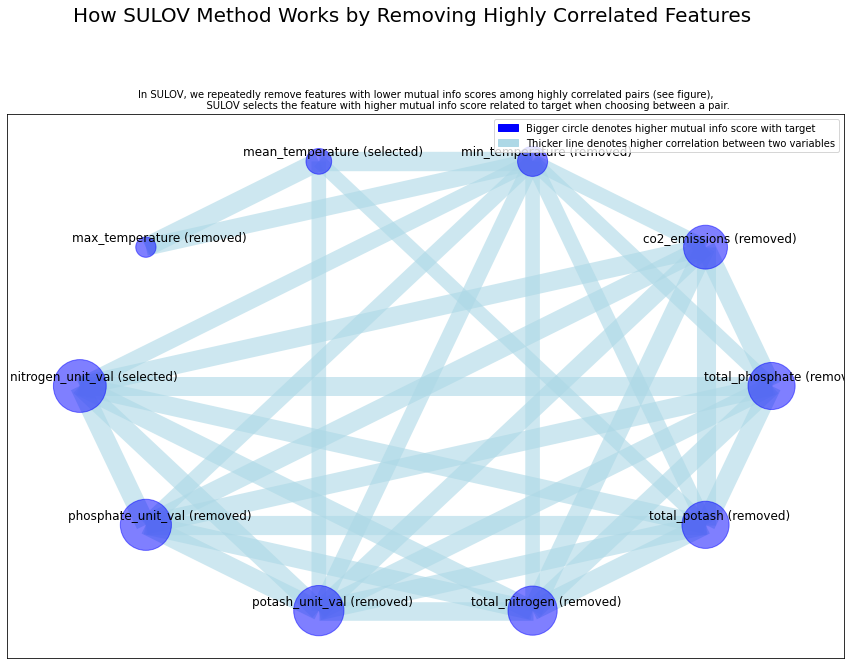

Time taken for SULOV method = 1 seconds
    Adding 0 categorical variables to reduced numeric variables  of 3
Final list of selected 3 vars after SULOV = ['precipitation', 'nitrogen_unit_val', 'mean_temperature']
Converting all features to numeric before sending to XGBoost...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
Current number of predictors before recursive XGBoost = 3 
    Taking top 2 features per iteration...
    XGBoost version using 0.90 as tree method: gpu_hist
Number of booster rounds = 100
        using 3 variables...
            selecting 1 features in this iteration
            Time taken for regular XGBoost feature selection = 2 seconds


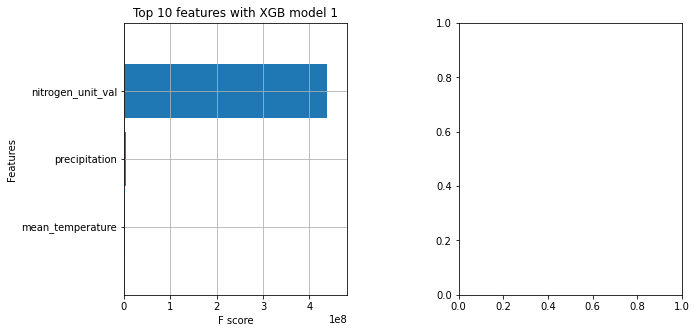

    Completed XGBoost feature selection in 0 seconds
    Alert: No ID variables ['area_harvested', 'production'] are included in selected features
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 1 important features:
['nitrogen_unit_val']
Total Time taken for featurewiz selection = 2 seconds
Output contains a list of 1 important features and a train dataframe


In [ ]:
target='yield'
features = featurewiz(df, target, corr_limit=0.70, verbose = 2)

# Imputation

In [ ]:
df.isnull().sum()

year                   0
area_harvested         0
production             0
nitrogen_unit_val      0
phosphate_unit_val     0
potash_unit_val        0
co2_emissions         29
total_nitrogen         0
total_phosphate        0
total_potash           0
mean_temperature       0
max_temperature        0
min_temperature        0
precipitation          0
yield                  0
dtype: int64

Visualizing nulls in dataset

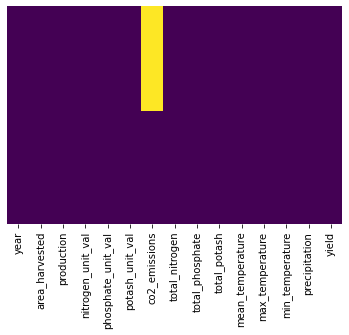

In [ ]:
sns.heatmap(df.isnull(), yticklabels=False, cbar=False, cmap='viridis')

29 missing values in co2_emissions

In [ ]:
def show_density(name, data):
   #Get statistics
   min_val = data.min()
   max_val = data.max()
   mean_val = data.mean()
   med_val = data.median()
   mod_val = data.mode()[0]

   print('Minimum:{:.2f}\nMean:{:.2f}\nMedian:{:.2f}\nMode:{:.2f}\nMaximum:{:.2f}\n'.format(min_val, mean_val, med_val, mod_val, max_val))

   fig = plt.figure(figsize=(10, 4))

   #plot density
   data.plot.density()

   plt.title('Data Density ' + name, fontsize=12)
   plt.ylabel('Density', fontsize=16)
   plt.tick_params(axis='both', which='major', labelsize=12)
   plt.tick_params(axis='both', which='minor', labelsize=12)

   #show mean, median, and mode
   plt.axvline(x=data.mean(), color = 'black', linestyle='dashed', linewidth = 3)
   plt.axvline(x=data.median(), color = 'darkgray', linestyle='dashdot', linewidth = 3)
   plt.axvline(x=data.mode()[0], color = 'gray', linestyle='dotted', linewidth = 3)
   plt.show()


Minimum:35026.94
Mean:105530.72
Median:94613.77
Mode:35026.94
Maximum:195047.97



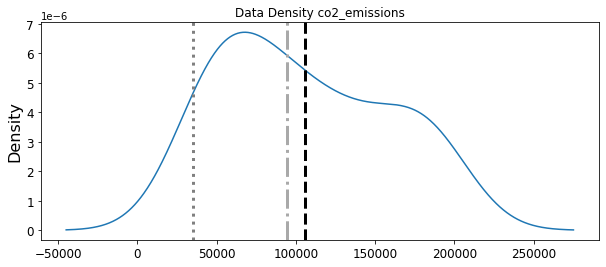

In [ ]:
show_density('co2_emissions', df['co2_emissions'])

* Here mean > median, mean > mode and meidan > mode. Distribution looks like right skewed.
* It looks like it follows polynomial trend as we see the peaks.

In [ ]:
from sklearn.impute import SimpleImputer
imp_mean = SimpleImputer(strategy='mean')
imp_mean.fit(df)

SimpleImputer()

In [ ]:
imputed_train_array = imp_mean.transform(df)
imputed_traindf = pd.DataFrame(imputed_train_array)
imputed_traindf = pd.DataFrame(imputed_train_array, columns = df.columns)

In [ ]:
imputed_traindf.isna().sum()

year                  0
area_harvested        0
production            0
nitrogen_unit_val     0
phosphate_unit_val    0
potash_unit_val       0
co2_emissions         0
total_nitrogen        0
total_phosphate       0
total_potash          0
mean_temperature      0
max_temperature       0
min_temperature       0
precipitation         0
yield                 0
dtype: int64

Minimum:35026.94
Mean:105530.72
Median:105530.72
Mode:105530.72
Maximum:195047.97



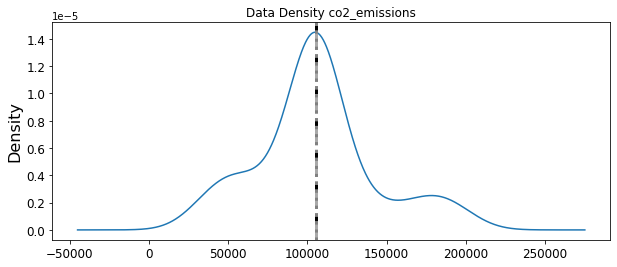

In [ ]:
show_density('co2_emissions', imputed_traindf['co2_emissions'])

Now the distribution got changed, so cannot use mean imputation

* Now Lets use most_frequent strategy

In [ ]:
df.isnull().sum()

year                   0
area_harvested         0
production             0
nitrogen_unit_val      0
phosphate_unit_val     0
potash_unit_val        0
co2_emissions         29
total_nitrogen         0
total_phosphate        0
total_potash           0
mean_temperature       0
max_temperature        0
min_temperature        0
precipitation          0
yield                  0
dtype: int64

In [ ]:
from sklearn.impute import SimpleImputer
imp_mean = SimpleImputer(strategy='most_frequent')
imp_mean.fit(df)
imputed_train_array = imp_mean.transform(df)
imputed_traindf = pd.DataFrame(imputed_train_array)
imputed_traindf = pd.DataFrame(imputed_train_array, columns = df.columns)

In [ ]:
imputed_traindf.isnull().sum()

year                  0
area_harvested        0
production            0
nitrogen_unit_val     0
phosphate_unit_val    0
potash_unit_val       0
co2_emissions         0
total_nitrogen        0
total_phosphate       0
total_potash          0
mean_temperature      0
max_temperature       0
min_temperature       0
precipitation         0
yield                 0
dtype: int64

Minimum:35026.94
Mean:71453.89
Median:36771.20
Mode:35026.94
Maximum:195047.97



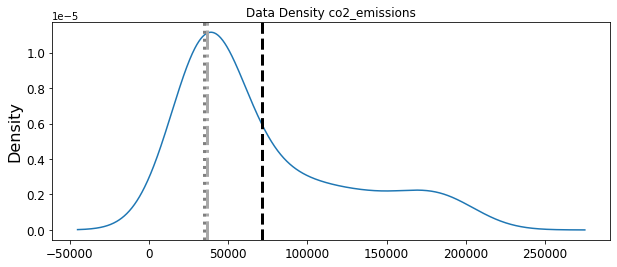

In [ ]:
show_density('co2_emissions', imputed_traindf['co2_emissions'])

Here mean > median, mean > mode and median is slightly greater than mode

Minimum:35026.94
Mean:100254.20
Median:94613.77
Mode:94613.77
Maximum:195047.97



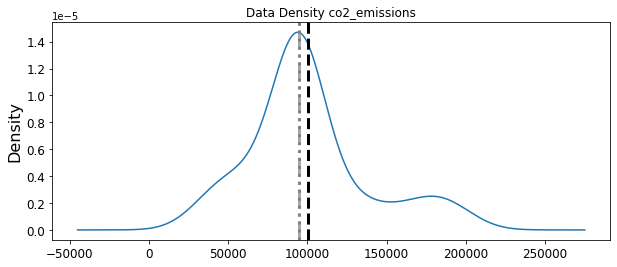

In [ ]:
from sklearn.impute import SimpleImputer
imp_mean = SimpleImputer(strategy='median')
imp_mean.fit(df)
imputed_train_array = imp_mean.transform(df)
imputed_traindf = pd.DataFrame(imputed_train_array)
imputed_traindf = pd.DataFrame(imputed_train_array, columns = df.columns)
show_density('co2_emissions', imputed_traindf['co2_emissions'])

There is deviation from initial distribution.

# MICE (Multivariate Imputation using Chained Equations)

In [ ]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import RandomForestRegressor

In [ ]:
estimator=RandomForestRegressor(max_depth=8)
mice = IterativeImputer(estimator=estimator,random_state=11,skip_complete=True)

In [ ]:
impdata=mice.fit_transform(df)
impdata=pd.DataFrame(impdata,columns=df.columns)

In [ ]:
impdata.isnull().sum().sort_values(ascending=False)

year                  0
area_harvested        0
production            0
nitrogen_unit_val     0
phosphate_unit_val    0
potash_unit_val       0
co2_emissions         0
total_nitrogen        0
total_phosphate       0
total_potash          0
mean_temperature      0
max_temperature       0
min_temperature       0
precipitation         0
yield                 0
dtype: int64

Minimum:35026.94
Mean:74042.87
Median:42197.85
Mode:39754.34
Maximum:195047.97



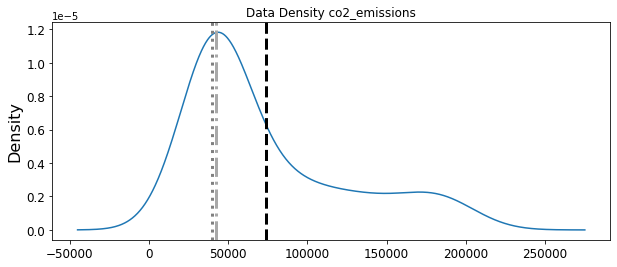

In [ ]:
show_density('co2_emissions', impdata['co2_emissions'])

Here mean > median, median > mode and median > mode. So most_frequent or MICE can be used to impute.

Let's use MICE imputation.

In [ ]:
impdata.head(5)

,year,area_harvested,production,nitrogen_unit_val,phosphate_unit_val,potash_unit_val,co2_emissions,total_nitrogen,total_phosphate,total_potash,mean_temperature,max_temperature,min_temperature,precipitation,yield
0,1961.0,375000.0,2719000.0,1.55,0.38,0.17,39283.956276,581250.0,142500.0,63750.0,25.02,31.47,18.62,1198.89,72507.0
1,1962.0,365000.0,2447000.0,2.05,0.51,0.22,39415.631050,748250.0,186150.0,80300.0,25.25,31.88,18.66,1150.14,67041.0
2,1963.0,413000.0,3365000.0,2.33,0.72,0.31,39415.631050,962290.0,297360.0,128030.0,25.24,31.91,18.62,1155.26,81477.0
3,1964.0,415000.0,2593000.0,3.42,0.92,0.43,40146.726981,1419300.0,381800.0,178450.0,25.37,32.07,18.71,1093.66,62482.0
4,1965.0,429000.0,3605000.0,3.54,0.82,0.48,40167.510071,1518660.0,351780.0,205920.0,25.40,32.12,18.72,833.79,84033.0


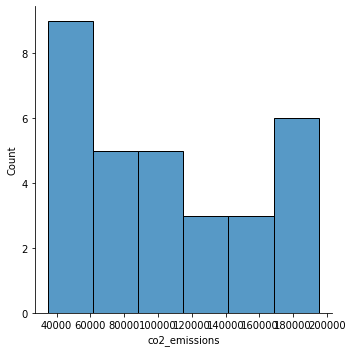

In [ ]:
sns.displot(df, x="co2_emissions")

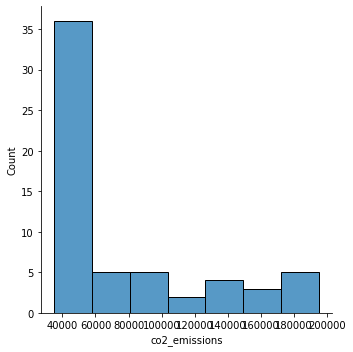

In [ ]:
sns.displot(impdata, x="co2_emissions")

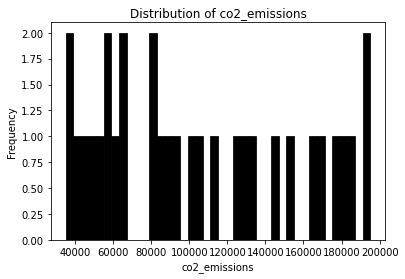

In [ ]:
plt.figure(figsize=(6, 4))

sns.histplot(df.co2_emissions[df.co2_emissions < 1000000], bins=40, color='black', alpha=1)
plt.ylabel('Frequency')
plt.xlabel('co2_emissions')
plt.title('Distribution of co2_emissions')

plt.show()

In [ ]:
impdata.head(5)

,year,area_harvested,production,nitrogen_unit_val,phosphate_unit_val,potash_unit_val,co2_emissions,total_nitrogen,total_phosphate,total_potash,mean_temperature,max_temperature,min_temperature,precipitation,yield
0,1961.0,375000.0,2719000.0,1.55,0.38,0.17,39283.956276,581250.0,142500.0,63750.0,25.02,31.47,18.62,1198.89,72507.0
1,1962.0,365000.0,2447000.0,2.05,0.51,0.22,39415.631050,748250.0,186150.0,80300.0,25.25,31.88,18.66,1150.14,67041.0
2,1963.0,413000.0,3365000.0,2.33,0.72,0.31,39415.631050,962290.0,297360.0,128030.0,25.24,31.91,18.62,1155.26,81477.0
3,1964.0,415000.0,2593000.0,3.42,0.92,0.43,40146.726981,1419300.0,381800.0,178450.0,25.37,32.07,18.71,1093.66,62482.0
4,1965.0,429000.0,3605000.0,3.54,0.82,0.48,40167.510071,1518660.0,351780.0,205920.0,25.40,32.12,18.72,833.79,84033.0


In [ ]:
tmp_df = impdata.copy()

In [ ]:
tmp_df = tmp_df.drop('year', axis = 1)

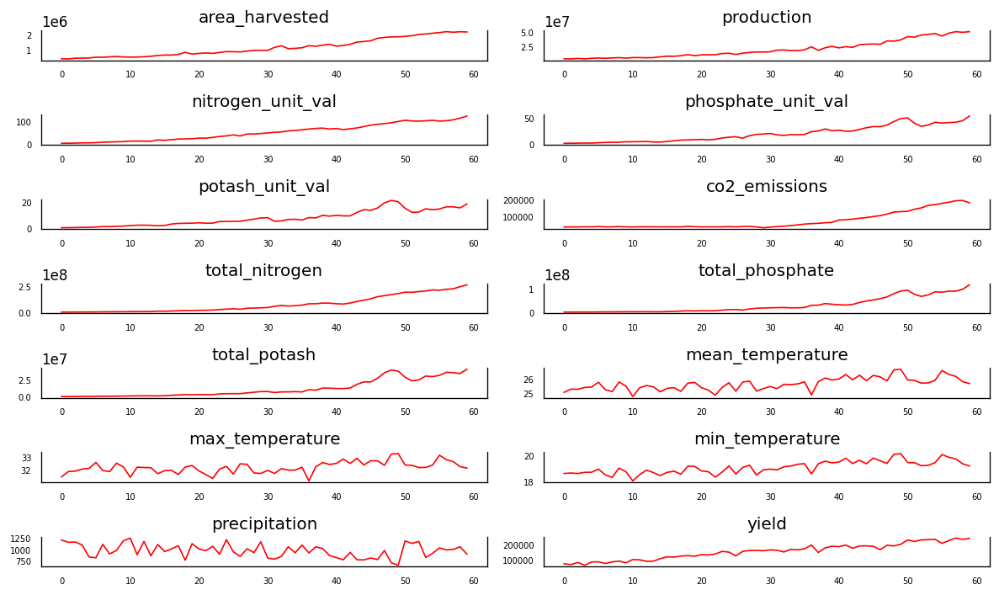

In [ ]:
# Plot
fig, axes = plt.subplots(nrows=7, ncols=2, dpi=120, figsize=(10,6))
for i, ax in enumerate(axes.flatten()):
 data = tmp_df[tmp_df.columns[i]]
 ax.plot(data, color='red', linewidth=1)
 ax.set_title(tmp_df.columns[i])
 ax.xaxis.set_ticks_position('none')
 ax.yaxis.set_ticks_position('none')
 ax.spines["top"].set_alpha(0)
 ax.tick_params(labelsize=6)
plt.tight_layout();

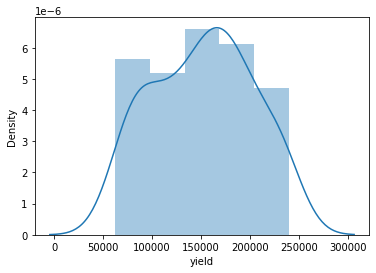

In [ ]:
sns.distplot(impdata['yield'])

We can say that, yield data is:
* Deviated from the normal distribution
* Has positive skewness
* And shows peakedness

In [ ]:
print("Skewness: %f" % impdata['yield'].skew())

Skewness: -0.034690


 👍 The rule of thumb seems to be: If the skewness is between -0.5 and 0.5, the data are fairly symmetrical. If the skewness is between -1 and – 0.5 or between 0.5 and 1, the data are moderately skewed. If the skewness is less than -1 or greater than 1, the data are highly skewed.

From this it is clear that yield data is highly skewed.

In [ ]:
print("Kurtosis: %f" % df['yield'].kurt())

Kurtosis: -1.044706


#Correlation Matrix

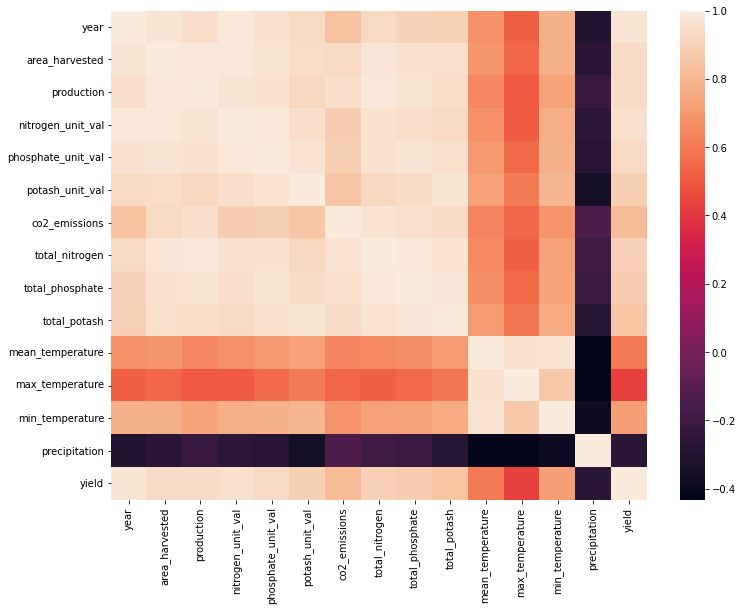

In [ ]:
corr_mat = impdata.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corr_mat)

* Correlation btwn yield and its top 15 features.

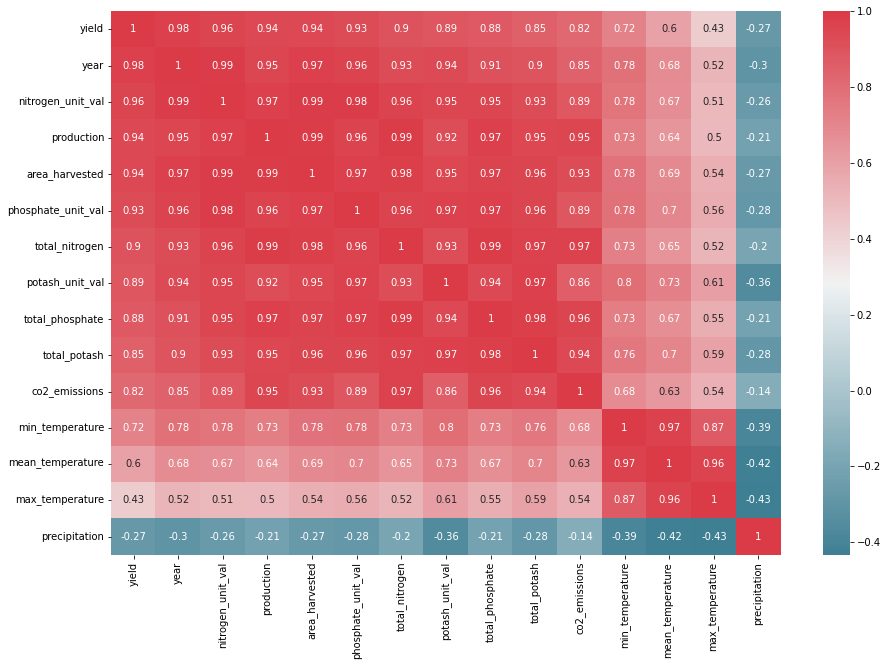

In [ ]:
top_featu = corr_mat.nlargest(15, 'yield').index

# Create color map ranging between two colours
cmap = sns.diverging_palette(220, 10, as_cmap=True)

coef = np.corrcoef(impdata[top_featu].T)
plt.subplots(figsize=(15, 10))
sns.heatmap(coef, cmap=cmap, annot=True, xticklabels=top_featu, yticklabels=top_featu)

Yield is correlated to almost every feature except precepitation.

* **Understanding Relationship of yield with min_temperature, mean_temp, precep and  and max_temp**

In [ ]:
fig = px.scatter(df,
                x="min_temperature",
                y="yield",
                hover_data=["min_temperature"],
                width=800,
                height=500,
                title="min_temperature vs yield")

fig.update_traces(marker_size=5)
fig.show()

In [ ]:
fig = px.scatter(df,
                x="max_temperature",
                y="yield",
                hover_data=["max_temperature"],
                width=800,
                height=500,
                title="max_temperature vs yield")

fig.update_traces(marker_size=5)
fig.show()

In [ ]:
fig = px.scatter(df,
                x="nitrogen_unit_val",
                y="yield",
                hover_data=["nitrogen_unit_val"],
                width=800,
                height=500,
                title="nitrogen_unit_val vs yield")

fig.update_traces(marker_size=5)
fig.show()

It is very clear that Yield increased with an increase in nitrogen quantity.

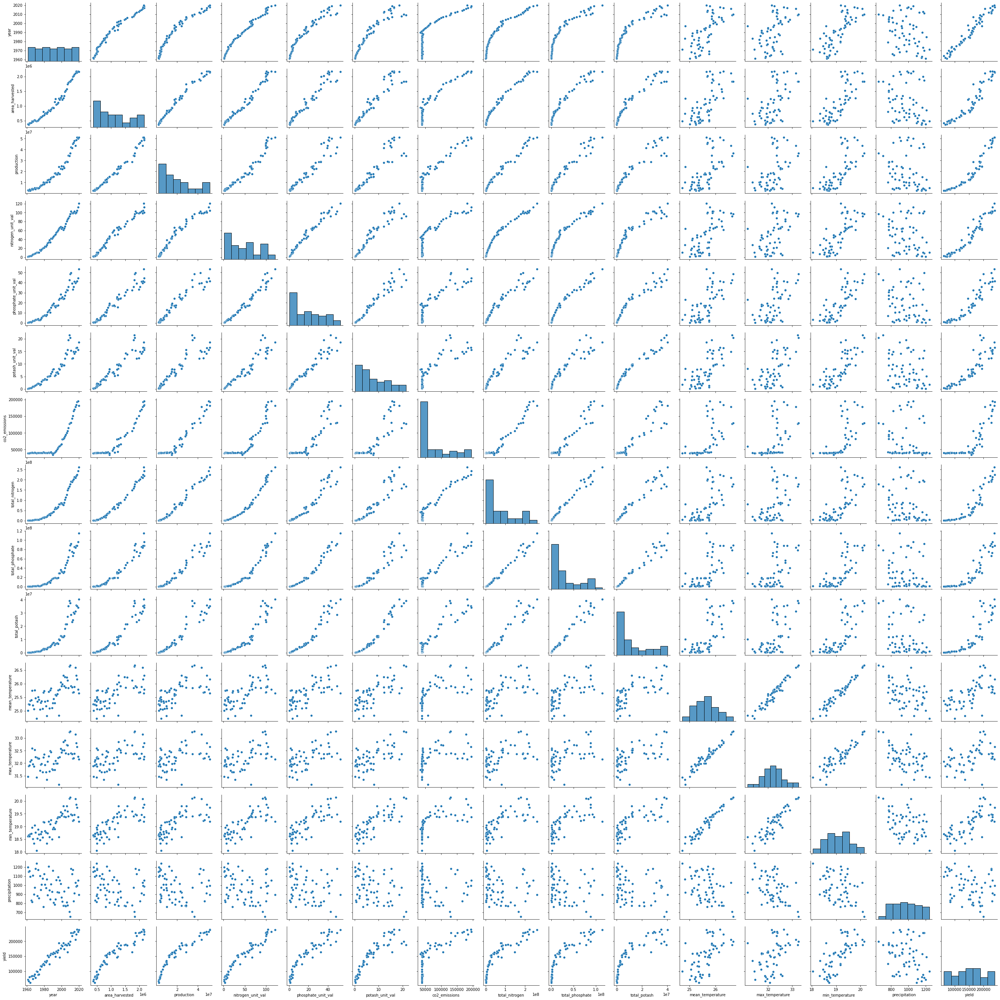

In [ ]:
sns.pairplot(impdata, size=2.5)

# Train and Test Data

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn import metrics

In [ ]:
y = df['yield']
scores =[]

In [ ]:
impdata.columns

Index(['year', 'area_harvested', 'production', 'nitrogen_unit_val',
       'phosphate_unit_val', 'potash_unit_val', 'co2_emissions',
       'total_nitrogen', 'total_phosphate', 'total_potash', 'mean_temperature',
       'max_temperature', 'min_temperature', 'precipitation', 'yield'],
      dtype='object')

In [ ]:
features = impdata[['area_harvested', 'production', 'nitrogen_unit_val', 'phosphate_unit_val', 'potash_unit_val', 'co2_emissions', 'mean_temperature', 'min_temperature', 'max_temperature', 'precipitation']]
X_train, X_test, y_train, y_test = train_test_split(features, y, test_size = 0.20, random_state = 123)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((48, 10), (12, 10), (48,), (12,))

In [ ]:
from sklearn.linear_model import LinearRegression
regr = LinearRegression()
regr.fit(X_train, y_train)
score =regr.score(X_test, y_test)

scores.append(score)
scores

[0.9218786228484642]

In [ ]:
y_pred = regr.predict(X_test)

In [ ]:
from sklearn.metrics import mean_absolute_error,mean_squared_error

mae = mean_absolute_error(y_true=y_test,y_pred=y_pred)
mse = mean_squared_error(y_true=y_test,y_pred=y_pred)
rmse = mean_squared_error(y_true=y_test,y_pred=y_pred,squared=False)

print("MAE:",mae)
print("MSE:",mse)
print("RMSE:",rmse)

MAE: 8779.546147671435
MSE: 109197348.51979713
RMSE: 10449.753514786707


Plotting the independant and dependant parameters in the dataset before scaling  

In [ ]:
fig = px.line(impdata, x='year', y=result.columns)
fig.show()

Data is on different scales in the above graph. To visualize and get meaningful insights, scaling data below 

# Standardized Scaling 

In [ ]:
from sklearn.preprocessing import StandardScaler,MinMaxScaler #MinMaxScaler used for standardization     

In [ ]:
impdata.head()

,year,area_harvested,production,nitrogen_unit_val,phosphate_unit_val,potash_unit_val,co2_emissions,total_nitrogen,total_phosphate,total_potash,mean_temperature,max_temperature,min_temperature,precipitation,yield
0,1961.0,375000.0,2719000.0,1.55,0.38,0.17,39283.956276,581250.0,142500.0,63750.0,25.02,31.47,18.62,1198.89,72507.0
1,1962.0,365000.0,2447000.0,2.05,0.51,0.22,39415.631050,748250.0,186150.0,80300.0,25.25,31.88,18.66,1150.14,67041.0
2,1963.0,413000.0,3365000.0,2.33,0.72,0.31,39415.631050,962290.0,297360.0,128030.0,25.24,31.91,18.62,1155.26,81477.0
3,1964.0,415000.0,2593000.0,3.42,0.92,0.43,40146.726981,1419300.0,381800.0,178450.0,25.37,32.07,18.71,1093.66,62482.0
4,1965.0,429000.0,3605000.0,3.54,0.82,0.48,40167.510071,1518660.0,351780.0,205920.0,25.40,32.12,18.72,833.79,84033.0


In [ ]:
df_result = impdata.drop('year', axis=1)

In [ ]:
df_result.head()

,area_harvested,production,nitrogen_unit_val,phosphate_unit_val,potash_unit_val,co2_emissions,total_nitrogen,total_phosphate,total_potash,mean_temperature,max_temperature,min_temperature,precipitation,yield
0,375000.0,2719000.0,1.55,0.38,0.17,39283.956276,581250.0,142500.0,63750.0,25.02,31.47,18.62,1198.89,72507.0
1,365000.0,2447000.0,2.05,0.51,0.22,39415.631050,748250.0,186150.0,80300.0,25.25,31.88,18.66,1150.14,67041.0
2,413000.0,3365000.0,2.33,0.72,0.31,39415.631050,962290.0,297360.0,128030.0,25.24,31.91,18.62,1155.26,81477.0
3,415000.0,2593000.0,3.42,0.92,0.43,40146.726981,1419300.0,381800.0,178450.0,25.37,32.07,18.71,1093.66,62482.0
4,429000.0,3605000.0,3.54,0.82,0.48,40167.510071,1518660.0,351780.0,205920.0,25.40,32.12,18.72,833.79,84033.0


In [ ]:
sc = MinMaxScaler()
df_new = pd.DataFrame(sc.fit_transform(df_result), columns=df_result.columns) 
     

In [ ]:
df_new.head()

,area_harvested,production,nitrogen_unit_val,phosphate_unit_val,potash_unit_val,co2_emissions,total_nitrogen,total_phosphate,total_potash,mean_temperature,max_temperature,min_temperature,precipitation,yield
0,0.005513,0.005567,0.000000,0.000000,0.000000,0.026603,0.000000,0.000000,0.000000,0.153061,0.150943,0.271429,0.927046,0.056619
1,0.000000,0.000000,0.004187,0.002460,0.002351,0.027426,0.000641,0.000380,0.000411,0.270408,0.344340,0.290476,0.844143,0.025748
2,0.026461,0.018787,0.006532,0.006433,0.006582,0.027426,0.001463,0.001350,0.001595,0.265306,0.358491,0.271429,0.852850,0.107280
3,0.027563,0.002988,0.015659,0.010218,0.012224,0.031994,0.003217,0.002086,0.002847,0.331633,0.433962,0.314286,0.748095,0.000000
4,0.035281,0.023699,0.016664,0.008325,0.014575,0.032124,0.003599,0.001824,0.003529,0.346939,0.457547,0.319048,0.306170,0.121716


In [ ]:
df_new_mm= pd.concat((impdata.year,df_new),1)

In [ ]:
df_new_mm.head()

,year,area_harvested,production,nitrogen_unit_val,phosphate_unit_val,potash_unit_val,co2_emissions,total_nitrogen,total_phosphate,total_potash,mean_temperature,max_temperature,min_temperature,precipitation,yield
0,1961.0,0.005513,0.005567,0.000000,0.000000,0.000000,0.026603,0.000000,0.000000,0.000000,0.153061,0.150943,0.271429,0.927046,0.056619
1,1962.0,0.000000,0.000000,0.004187,0.002460,0.002351,0.027426,0.000641,0.000380,0.000411,0.270408,0.344340,0.290476,0.844143,0.025748
2,1963.0,0.026461,0.018787,0.006532,0.006433,0.006582,0.027426,0.001463,0.001350,0.001595,0.265306,0.358491,0.271429,0.852850,0.107280
3,1964.0,0.027563,0.002988,0.015659,0.010218,0.012224,0.031994,0.003217,0.002086,0.002847,0.331633,0.433962,0.314286,0.748095,0.000000
4,1965.0,0.035281,0.023699,0.016664,0.008325,0.014575,0.032124,0.003599,0.001824,0.003529,0.346939,0.457547,0.319048,0.306170,0.121716


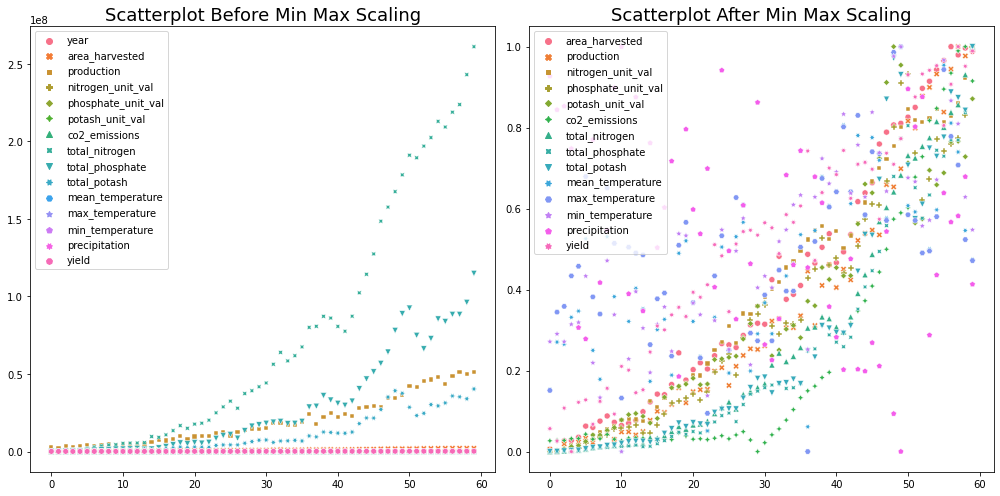

In [ ]:
plt.figure(figsize=(14,7))
plt.subplot(1,2,1)
plt.title("Scatterplot Before Min Max Scaling", fontsize=18)
sns.scatterplot(data = impdata, color="blue")
plt.subplot(1,2,2)
plt.title("Scatterplot After Min Max Scaling", fontsize=18)
sns.scatterplot(data = df_new, color="red")
plt.tight_layout()
plt.show()

#PDF

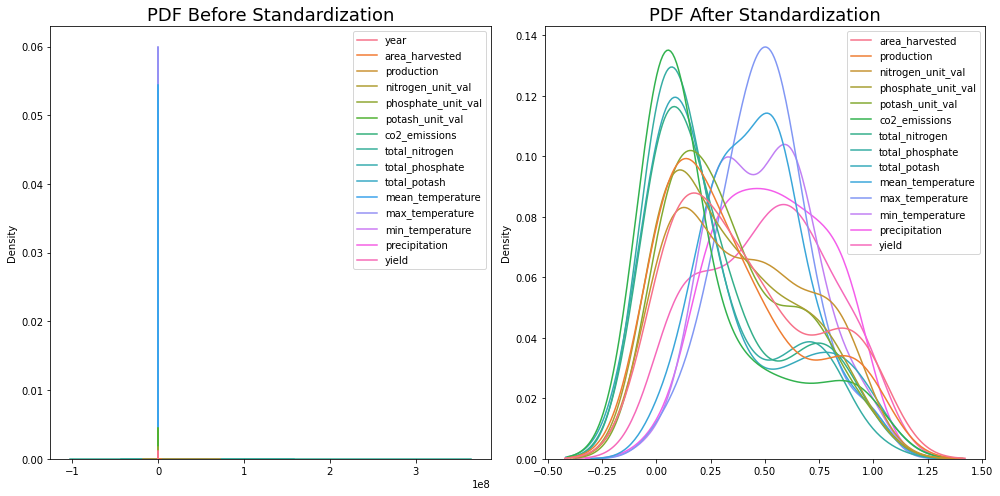

In [ ]:
plt.figure(figsize=(14,7))
plt.subplot(1,2,1)
plt.title("PDF Before Standardization", fontsize=18)
sns.kdeplot(data = impdata, color="blue")
plt.subplot(1,2,2)
plt.title("PDF After Standardization", fontsize=18)
sns.kdeplot(data = df_new, color="red")
plt.tight_layout()
plt.show()

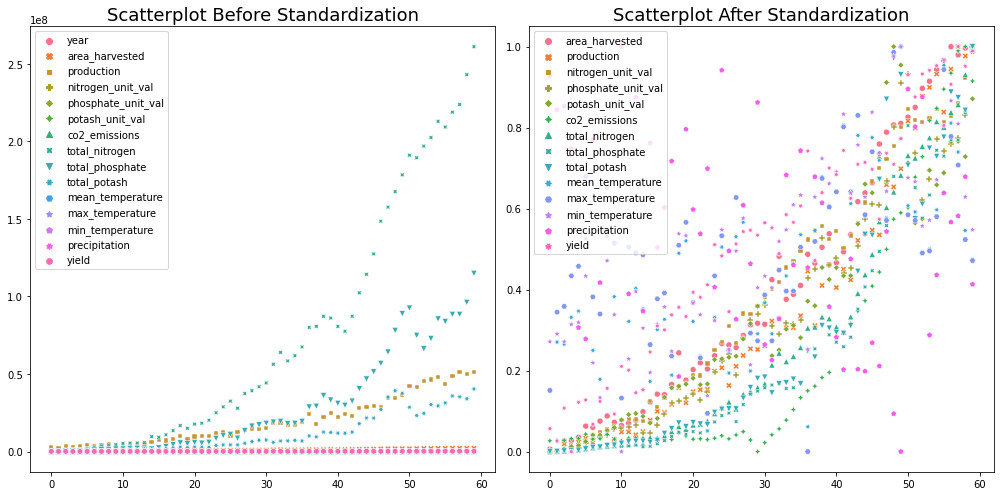

In [ ]:
plt.figure(figsize=(14,7))
plt.subplot(1,2,1)
plt.title("Scatterplot Before Standardization", fontsize=18)
sns.scatterplot(data = impdata, color="blue")
plt.subplot(1,2,2)
plt.title("Scatterplot After Standardization", fontsize=18)
sns.scatterplot(data = df_new, color="red")
plt.tight_layout()
plt.show()
     

#Train and Test data after MinMaxScaling

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn import metrics

In [ ]:
scores_scal = []

In [ ]:
#features = df_new_mm[['area_harvested', 'production', 'nitrogen_unit_val', 'phosphate_unit_val', 'potash_unit_val', 'co2_emissions', 'mean_temperature', 'min_temperature', 'max_temperature', 'precipitation']]
features = df_new_mm[['co2_emissions', 'phosphate_unit_val', 'nitrogen_unit_val', 'precipitation', 'potash_unit_val', 'max_temperature']]
X_train, X_test, y_train, y_test = train_test_split(features, y, test_size = 0.20, random_state = 123)
X_train.shape, X_test.shape, y_train.shape, y_test.shape
from sklearn.linear_model import LinearRegression
regr = LinearRegression()
regr.fit(X_train, y_train)
score_scal =regr.score(X_test, y_test)

scores_scal.append(score_scal)
scores_scal

[0.8324043678873926]

In [ ]:
y_pred = regr.predict(X_test)

In [ ]:
from sklearn.metrics import mean_absolute_error,mean_squared_error

mae = mean_absolute_error(y_true=y_test,y_pred=y_pred)
mse = mean_squared_error(y_true=y_test,y_pred=y_pred)
rmse = mean_squared_error(y_true=y_test,y_pred=y_pred,squared=False)

print("MAE:",mae)
print("MSE:",mse)
print("RMSE:",rmse)

MAE: 13203.120670257746
MSE: 234263646.10414872
RMSE: 15305.673657312465


score is the coefficient of determination of the prediction (R2). \
 Highest R2  is 0.88. \
 Most Imp Features: ['co2_emissions', 'potash_unit_val', 'phosphate_unit_val', 'nitrogen_unit_val', 'precipitation']

#Exploring data to derive meaningful Insights
After cleansing, processing, imputing and scaling, here we are exploring the data to understand and derive meaningful insights out of the dataset

**Checking the effect of nitrogen value, mean temperature and precipitation on yield of potatoes across years, since these 3 are the most important feature according to FeatureWiz**

In [ ]:
fig = px.line(df_new_mm, x='year', y=["nitrogen_unit_val", 'mean_temperature', 'precipitation', 'yield'])
fig.show()

**Influence of Nitrogen  on the yield of potatoes across years**

In [ ]:
fig = px.line(df_new_mm, x='year', y=['nitrogen_unit_val', 'yield'])
fig.show()

**Influence of temperature on the yield of potatoes across years**

In [ ]:
fig = px.line(df_new_mm, x='year', y=['mean_temperature', 'yield'])
fig.show()

**Influence of precipitation on the yield of potatoes across years**

In [ ]:
fig = px.line(df_new_mm, x='year', y=['precipitation', 'yield'])
fig.show()

**Influence of maximum temperature, precipitation on the yield of potatoes across years**

In [ ]:
fig = px.line(df_new_mm, x='year', y=['max_temperature', 'precipitation', 'yield'])
fig.show()

**Influence of CO2 emissions on the yield of potatoes across years**

In [ ]:
fig = px.line(df_new_mm, x='year', y=['co2_emissions', 'yield'])
fig.show()

**Scatter plot to view the influence of every parameter in the dataset on yield of potatoes**

Here we can also view that the yield of potatoes has increased over the years

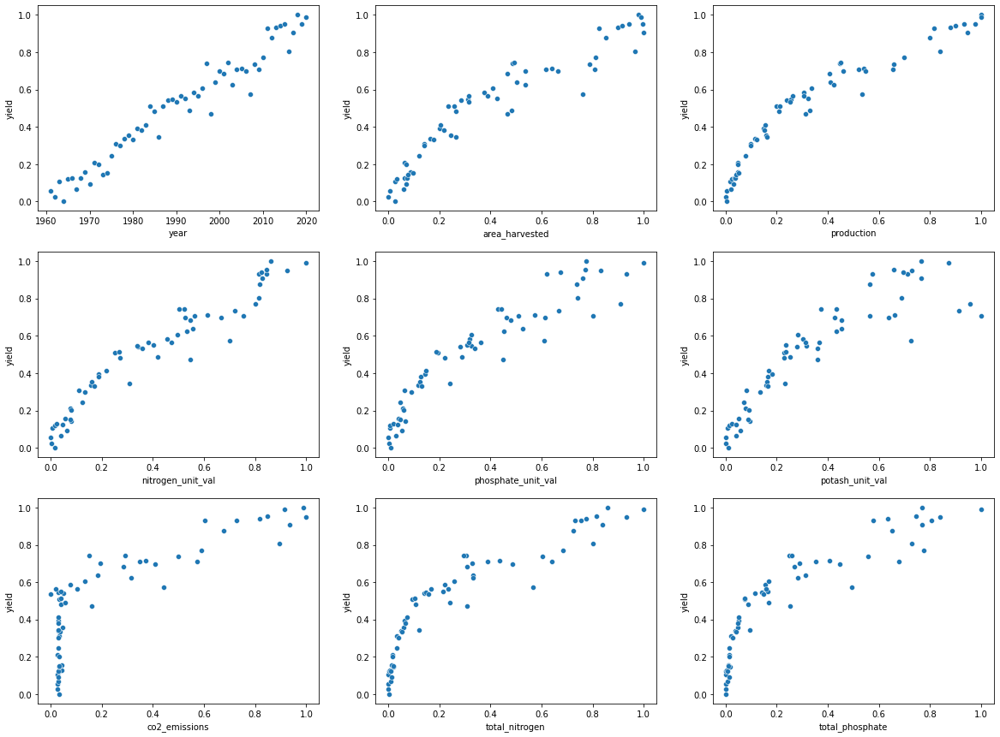

In [ ]:
fig, ax = plt.subplots(3, 3, figsize=(20, 15))
for var, subplot in zip(df_new_mm, ax.flatten()):
    sns.scatterplot(x=var, y='yield', data=df_new_mm, ax=subplot)

Visualization to understand the total production of potatoes and how much of it was harvested

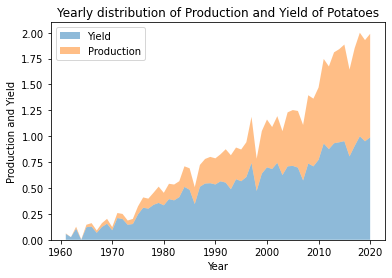

In [ ]:
x=df_new_mm['year']
y=[df_new_mm['yield'],df_new_mm['production']]

ax = plt.gca()
ax.stackplot(x, y, labels=['Yield', 'Production'],alpha=0.5)

plt.legend(loc='upper left')
plt.title('Yearly distribution of Production and Yield of Potatoes')
plt.xlabel('Year')
plt.ylabel('Production and Yield') 

plt.show()

Bubble plot to view the change in Min, Max and Mean temperature over years

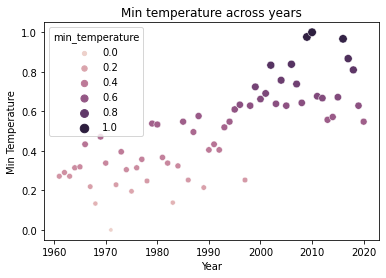

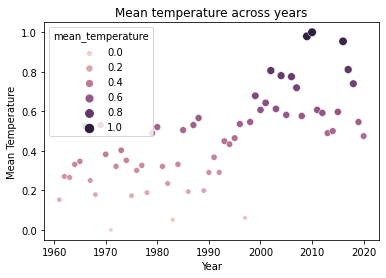

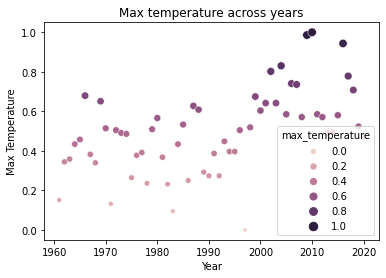

In [ ]:
sns.scatterplot(data=df_new_mm, x="year", y="min_temperature", hue="min_temperature", size="min_temperature")

plt.title('Min temperature across years')
plt.xlabel('Year')
plt.ylabel('Min Temperature') 

plt.show()

sns.scatterplot(data=df_new_mm, x="year", y="mean_temperature", hue="mean_temperature", size="mean_temperature")

plt.title('Mean temperature across years')
plt.xlabel('Year')
plt.ylabel('Mean Temperature') 

plt.show()

sns.scatterplot(data=df_new_mm, x="year", y="max_temperature", hue="max_temperature", size="max_temperature")

plt.title('Max temperature across years')
plt.xlabel('Year')
plt.ylabel('Max Temperature') 

plt.show()

Yield of potatoes from 1960 - 2020

In [ ]:
fig = px.line(df_new_mm, x='year', y='yield')
fig.show()

Performing Auto EDA using Pandas profiling for further Insights

In [ ]:
profile = ProfileReport(df_new_mm, title='Pandas Profiling report for yield of Potatoes', explorative = True)

In [ ]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#Conclusion

**Results and Findings**

 
In light of the above performed data analysis, we conclude that there could be some miscellaneous data that could contribute more for the yield factor of the potatoes. In addition to that, understanding more about the pH and seed technology can give different dimensions to the goal that we plan to achieve here. Inverse correlations between the features (for eg Yield and temperature) strongly suggest the presence of certain implicit factors that can contribute to the growth of the potatoes. Taking the time span (1961-2022) under consideration, we also reflect the changes in technology and events (2020 pandemic that witnessed production/trade shutdown) which can highly influence the yield factor in our problem statement.
